<i>For start, lets´s import some useful libraries.

Then, i find it interesting to change the display options of columns and rows for data frames. So, we will increase the rows and columns that we will see in our data frames.

Finally we will read our csv and establish our hypotheses.</i>

In [3]:
import pandas as pd
import numpy as np
import re

In [4]:
pd.set_option('display.max_rows', 6000)
pd.set_option('display.max_columns', 50)

In [5]:
shark_df = pd.read_csv('input/GSAF5.csv' , encoding = "ISO-8859-1")

-------------------------------------------

<h3>Hypothesis 1:</h3>

The <b>last two decades</b> (2000-2020) are where there have been more shark attacks.

The <b>year</b> in which there have been more shark attacks is in <b>this decade</b>.



<h3>Hypothesis 2:</h3>

The main activity in which, <b>men</b> have more accidents is related to <b>surfing</b>.

The main activity in which, <b>women</b> have more accidents is related to <b>swimming</b>.


--------------------------------------------


In [6]:
display(shark_df.head(100))

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href formula,href,Case Number.1,Case Number.2,original order,Unnamed: 22,Unnamed: 23
0,2016.09.18.c,18-Sep-16,2016,Unprovoked,USA,Florida,"New Smyrna Beach, Volusia County",Surfing,male,M,16,Minor injury to thigh,N,13h00,NaN,"Orlando Sentinel, 9/19/2016",2016.09.18.c-NSB.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.18.c,2016.09.18.c,5993,NaN,NaN
1,2016.09.18.b,18-Sep-16,2016,Unprovoked,USA,Florida,"New Smyrna Beach, Volusia County",Surfing,Chucky Luciano,M,36,Lacerations to hands,N,11h00,NaN,"Orlando Sentinel, 9/19/2016",2016.09.18.b-Luciano.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.18.b,2016.09.18.b,5992,NaN,NaN
2,2016.09.18.a,18-Sep-16,2016,Unprovoked,USA,Florida,"New Smyrna Beach, Volusia County",Surfing,male,M,43,Lacerations to lower leg,N,10h43,NaN,"Orlando Sentinel, 9/19/2016",2016.09.18.a-NSB.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.18.a,2016.09.18.a,5991,NaN,NaN
3,2016.09.17,17-Sep-16,2016,Unprovoked,AUSTRALIA,Victoria,Thirteenth Beach,Surfing,Rory Angiolella,M,NaN,Struck by fin on chest & leg,N,NaN,NaN,"The Age, 9/18/2016",2016.09.17-Angiolella.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.17,2016.09.17,5990,NaN,NaN
4,2016.09.15,16-Sep-16,2016,Unprovoked,AUSTRALIA,Victoria,Bells Beach,Surfing,male,M,NaN,No injury: Knocked off board by shark,N,NaN,2 m shark,"The Age, 9/16/2016",2016.09.16-BellsBeach.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.16,2016.09.15,5989,NaN,NaN
5,2016.09.15.R,15-Sep-16,2016,Boat,AUSTRALIA,Western Australia,Bunbury,Fishing,Occupant: Ben Stratton,NaN,NaN,Shark rammed boat. No injury to occupant,N,NaN,NaN,"West Australian, 9/15/2016",2016.09.15.R-boat.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.15.R,2016.09.15.R,5988,NaN,NaN
6,2016.09.11,11-Sep-16,2016,Unprovoked,USA,Florida,"Ponte Vedra, St. Johns County",Wading,male,M,60s,Minor injury to arm,N,15h15,3' to 4' shark,"News4Jax, 9/11/2016",2016.09.11-PonteVedra.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.11,2016.09.11,5987,NaN,NaN
7,2016.09.07,07-Sep-16,2016,Unprovoked,USA,Hawaii,"Makaha, Oahu",Swimming,female,F,51,Severe lacerations to shoulder & forearm,N,14h30,"Tiger shark, 10?","Hawaii News Now, 9/7/2016",2016.09.07-Oahu.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.07,2016.09.07,5986,NaN,NaN
8,2016.09.06,06-Sep-16,2016,Unprovoked,NEW CALEDONIA,North Province,Koumac,Kite surfing,David Jewell,M,50,FATAL,Y,15h40,NaN,"TVANouvelles, 9/6/2016",2016.09.06-Jewell.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.06,2016.09.06,5985,NaN,NaN
9,2016.09.05.b,05-Sep-16,2016,Unprovoked,USA,South Carolina,"Kingston Plantation, Myrtle Beach, Horry County",Boogie boarding,Rylie Williams,F,12,Lacerations & punctures to lower right leg,N,Late afternoon,NaN,"C. Creswell, GSAF",2016.09.05.b-Williams.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.05.b,2016.09.05.b,5984,NaN,NaN


In [7]:
shark_df.shape

(5992, 24)

In [8]:
shark_df.columns

Index(['Case Number', 'Date', 'Year', 'Type', 'Country', 'Area', 'Location',
       'Activity', 'Name', 'Sex ', 'Age', 'Injury', 'Fatal (Y/N)', 'Time',
       'Species ', 'Investigator or Source', 'pdf', 'href formula', 'href',
       'Case Number.1', 'Case Number.2', 'original order', 'Unnamed: 22',
       'Unnamed: 23'],
      dtype='object')

<i>Ok, we have taken a quick look to get the big picture about our dataframe.

Now we will clean it. In fact, we dont need most of the columns but for the  sake of the exercise we will simply drop the less useful columns.

We will collect the remaining data in the new data frame "shark_reduced".</i>

In [9]:
shark_reduced = shark_df[["Case Number","Date","Type",'Activity', 'Name', 'Sex ', 'Age', 'Injury', 'Fatal (Y/N)','Species ']]
shark_reduced.head(1000)

,Case Number,Date,Type,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Species
0,2016.09.18.c,18-Sep-16,Unprovoked,Surfing,male,M,16,Minor injury to thigh,N,NaN
1,2016.09.18.b,18-Sep-16,Unprovoked,Surfing,Chucky Luciano,M,36,Lacerations to hands,N,NaN
2,2016.09.18.a,18-Sep-16,Unprovoked,Surfing,male,M,43,Lacerations to lower leg,N,NaN
3,2016.09.17,17-Sep-16,Unprovoked,Surfing,Rory Angiolella,M,NaN,Struck by fin on chest & leg,N,NaN
4,2016.09.15,16-Sep-16,Unprovoked,Surfing,male,M,NaN,No injury: Knocked off board by shark,N,2 m shark
5,2016.09.15.R,15-Sep-16,Boat,Fishing,Occupant: Ben Stratton,NaN,NaN,Shark rammed boat. No injury to occupant,N,NaN
6,2016.09.11,11-Sep-16,Unprovoked,Wading,male,M,60s,Minor injury to arm,N,3' to 4' shark
7,2016.09.07,07-Sep-16,Unprovoked,Swimming,female,F,51,Severe lacerations to shoulder & forearm,N,"Tiger shark, 10?"
8,2016.09.06,06-Sep-16,Unprovoked,Kite surfing,David Jewell,M,50,FATAL,Y,NaN
9,2016.09.05.b,05-Sep-16,Unprovoked,Boogie boarding,Rylie Williams,F,12,Lacerations & punctures to lower right leg,N,NaN


<i>Now let's clean and get some time data.

If we take a look at the "Date" column, we will realize that the data has many different patterns and we will face some problems to normalize them.

On the other hand, the "Case number" column has an easy pattern with all the information we want to extract: year, month and day.

For that task we will create some functions and use de apply method.

We will call our three functions:

createYear
createMonth
createDay

Them will extract the information we need with the use ReGex.</i>

In [10]:
 def createYear(date):
        year = re.search('\d+.',date).end()
        return date[:year - 1]
  
    
shark_reduced["Year"] = shark_reduced["Case Number"].apply(createYear)
shark_reduced["Year"]                                                         
                                                        

C:\Users\guillermo.martinez\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


0         2016
1         2016
2         2016
3         2016
4         2016
5         2016
6         2016
7         2016
8         2016
9         2016
10        2016
11        2016
12        2016
13        2016
14        2016
15        2016
16        2016
17        2016
18        2016
19        2016
20        2016
21        2016
22        2016
23        2016
24        2016
25        2016
26        2016
27        2016
28        2016
29        2016
30        2016
31        2016
32        2016
33        2016
34        2016
35        2016
36        2016
37        2016
38        2016
39        2016
40        2016
41        2016
42        2016
43        2016
44        2016
45        2016
46        2016
47        2016
48        2016
49        2016
50        2016
51        2016
52        2016
53        2016
54        2016
55        2016
56        2016
57        2016
58        2016
59        2016
60        2016
61        2016
62        2016
63        2016
64        2016
65        2016
66        

In [11]:
def createMonth(date):
        match = re.search('(\d+)\.([\d+]+).([\d+]+)',date)
        if match:
            return match.group(2)
  
    
shark_reduced["Month"] = shark_reduced["Case Number"].apply(createMonth)
shark_reduced["Month"]  

C:\Users\guillermo.martinez\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


0         09
1         09
2         09
3         09
4         09
5         09
6         09
7         09
8         09
9         09
10        09
11        09
12        09
13        08
14        08
15        08
16        08
17        08
18        08
19        08
20        07
21        07
22        07
23        07
24        07
25        07
26        07
27        07
28        07
29        07
30        07
31        07
32        07
33        07
34        07
35        07
36        07
37        07
38        07
39        07
40        06
41        06
42        06
43        06
44        06
45        06
46        06
47        06
48        06
49        06
50        06
51        06
52        06
53        06
54        06
55        06
56        05
57        05
58        05
59        05
60        05
61        05
62        05
63        05
64        05
65        05
66        04
67        04
68        04
69        04
70        04
71        04
72        04
73        04
74        04
75        04
76        03

In [12]:
def createDay(date):
        match = re.search('(\d+)\.([\d+]+).([\d+]+)',date)
        if match:
            return match.group(3)
  
    
shark_reduced["Day"] = shark_reduced["Case Number"].apply(createDay)
shark_reduced["Day"]  

C:\Users\guillermo.martinez\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


0         18
1         18
2         18
3         17
4         15
5         15
6         11
7         07
8         06
9         05
10        05
11        04
12        01
13        29
14        29
15        27
16        25
17        07
18        06
19        04
20        29
21        28
22        28
23        27
24        26
25        24
26        23
27        23
28        20
29        17
30        16
31        16
32        15
33        14
34        08
35        08
36        07
37        07
38        06
39        04
40        27
41        25
42        24
43        23
44        21
45        21
46        15
47        15
48        14
49        11
50        07
51        05
52        05
53        04
54        02
55        02
56        31
57        29
58        29
59        22
60        21
61        21
62        18
63        15
64        03
65        02
66        25
67        23
68        22
69        19
70        18
71        13
72        09
73        08
74        07
75        07
76        31

<i>Now we dont need the "Date" column so we will drop it.

In [13]:
shark_reduced = shark_reduced.drop(["Date"], axis=1)
shark_reduced

,Case Number,Type,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Species,Year,Month,Day
0,2016.09.18.c,Unprovoked,Surfing,male,M,16,Minor injury to thigh,N,NaN,2016,09,18
1,2016.09.18.b,Unprovoked,Surfing,Chucky Luciano,M,36,Lacerations to hands,N,NaN,2016,09,18
2,2016.09.18.a,Unprovoked,Surfing,male,M,43,Lacerations to lower leg,N,NaN,2016,09,18
3,2016.09.17,Unprovoked,Surfing,Rory Angiolella,M,NaN,Struck by fin on chest & leg,N,NaN,2016,09,17
4,2016.09.15,Unprovoked,Surfing,male,M,NaN,No injury: Knocked off board by shark,N,2 m shark,2016,09,15
5,2016.09.15.R,Boat,Fishing,Occupant: Ben Stratton,NaN,NaN,Shark rammed boat. No injury to occupant,N,NaN,2016,09,15
6,2016.09.11,Unprovoked,Wading,male,M,60s,Minor injury to arm,N,3' to 4' shark,2016,09,11
7,2016.09.07,Unprovoked,Swimming,female,F,51,Severe lacerations to shoulder & forearm,N,"Tiger shark, 10?",2016,09,07
8,2016.09.06,Unprovoked,Kite surfing,David Jewell,M,50,FATAL,Y,NaN,2016,09,06
9,2016.09.05.b,Unprovoked,Boogie boarding,Rylie Williams,F,12,Lacerations & punctures to lower right leg,N,NaN,2016,09,05


-----------------------------

<i>Cleaning is funny isn't  it?

Ok our next step in the road is related to the activities. If take a look at the different activities we will realise that most of them can be included in more global categories, and that we will be important to test our hypotheses.

So, let's  try to make some more functions to obtain these global categories.

In [14]:
shark_reduced["Activity"].value_counts().sort_values(ascending=False)

Surfing                                                                                                                                                                                                                                                            904
Swimming                                                                                                                                                                                                                                                           819
Fishing                                                                                                                                                                                                                                                            414
Spearfishing                                                                                                                                                                                                       

In [15]:
shark_reduced["Activity"]

0                                                 Surfing
1                                                 Surfing
2                                                 Surfing
3                                                 Surfing
4                                                 Surfing
5                                                 Fishing
6                                                  Wading
7                                                Swimming
8                                            Kite surfing
9                                         Boogie boarding
10                                                Surfing
11                                          Body boarding
12                                           Spearfishing
13                                                Surfing
14                                                Surfing
15                                                Surfing
16                                                 Wading
17            

In [16]:
def detectSurf(activity):
    if "surf" in str(activity).lower():
        return "Surfing"
    
    elif "boarding" in str(activity).lower():
        return "Surfing"
    
    else:
        return activity

shark_reduced["Activity"] = shark_reduced["Activity"].apply(detectSurf)


    

In [17]:
shark_reduced[(shark_reduced["Activity"] == "Windsurfing")].shape

(0, 12)

In [18]:
shark_reduced[(shark_reduced["Activity"] == "Surfing") ].shape


(1322, 12)

In [19]:
def softActivity(activity):
    if "floating in tube" in str(activity).lower():
        return "Swimming"
    
    elif "floating" in str(activity).lower():
        return "Swimming"
    
    elif "rowing" in str(activity).lower():
        return "Swimming"

    elif "snorkeling" in str(activity).lower():
        return "Swimming"

    elif "standing" in str(activity).lower():
        return "Swimming"

    elif "bathing" in str(activity).lower():
        return "Swimming"
    
    elif "playing in the water" in str(activity).lower():
        return "Swimming"

    elif "playing" in str(activity).lower():
        return "Swimming"

    elif "sitting in the water" in str(activity).lower():
        return "Swimming"

    elif "wading" in str(activity).lower():
        return "Swimming"
    
    elif "swimming" in str(activity).lower():
        return "Swimming"

    elif "treading water" in str(activity).lower():
        return "Swimming"
    
    elif "walking" in str(activity).lower():
        return "Swimming"
    
    else:
        return activity

shark_reduced["Activity"] = shark_reduced["Activity"].apply(softActivity)

In [20]:
shark_reduced[(shark_reduced["Activity"] == "Bathing")].shape

(0, 12)

In [21]:
def diving(activity):
    if "diving" in str(activity).lower():
        return "Diving"
    
    elif "diving for beche-de-mer" in str(activity).lower():
        return "Diving"
    
    elif "filming" in str(activity).lower():
        return "Diving"

    elif "diving / filming" in str(activity).lower():
        return "Diving"

    elif "scuba diving" in str(activity).lower():
        return "Diving"

    elif "scallop diving on hookah" in str(activity).lower():
        return "Diving"
    
    elif "pearl diving" in str(activity).lower():
        return "Diving"

    elif "free diving" in str(activity).lower():
        return "Diving"

    else:
        return activity

shark_reduced["Activity"] = shark_reduced["Activity"].apply(diving)

In [22]:
def fishing(activity):
    if "fishing" in str(activity).lower():
        return "Fishing"
    
    elif "lobstering" in str(activity).lower():
        return "Fishing"

    else:
        return activity

shark_reduced["Activity"] = shark_reduced["Activity"].apply(fishing)

In [23]:
shark_reduced["Activity"].value_counts() [shark_reduced["Activity"].value_counts() > 500]


Swimming    1754
Surfing     1322
Fishing     1035
Diving       534
Name: Activity, dtype: int64

In [24]:
shark_reduced[(shark_reduced["Activity"] == "Surfing") | (shark_reduced["Activity"] == "Swimming") | (shark_reduced["Activity"] == "Diving") | (shark_reduced["Activity"] == "Fishing")].shape

(4645, 12)

<i>We did some checks after apply the functions and now we are going to update our data frame keeping only the main activities.

In [25]:
shark_reduced = shark_reduced[(shark_reduced["Activity"] == "Surfing") | (shark_reduced["Activity"] == "Swimming") | (shark_reduced["Activity"] == "Diving") | (shark_reduced["Activity"] == "Fishing")]

shark_reduced

,Case Number,Type,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Species,Year,Month,Day
0,2016.09.18.c,Unprovoked,Surfing,male,M,16,Minor injury to thigh,N,NaN,2016,09,18
1,2016.09.18.b,Unprovoked,Surfing,Chucky Luciano,M,36,Lacerations to hands,N,NaN,2016,09,18
2,2016.09.18.a,Unprovoked,Surfing,male,M,43,Lacerations to lower leg,N,NaN,2016,09,18
3,2016.09.17,Unprovoked,Surfing,Rory Angiolella,M,NaN,Struck by fin on chest & leg,N,NaN,2016,09,17
4,2016.09.15,Unprovoked,Surfing,male,M,NaN,No injury: Knocked off board by shark,N,2 m shark,2016,09,15
5,2016.09.15.R,Boat,Fishing,Occupant: Ben Stratton,NaN,NaN,Shark rammed boat. No injury to occupant,N,NaN,2016,09,15
6,2016.09.11,Unprovoked,Swimming,male,M,60s,Minor injury to arm,N,3' to 4' shark,2016,09,11
7,2016.09.07,Unprovoked,Swimming,female,F,51,Severe lacerations to shoulder & forearm,N,"Tiger shark, 10?",2016,09,07
8,2016.09.06,Unprovoked,Surfing,David Jewell,M,50,FATAL,Y,NaN,2016,09,06
9,2016.09.05.b,Unprovoked,Surfing,Rylie Williams,F,12,Lacerations & punctures to lower right leg,N,NaN,2016,09,05


In [26]:
shark_reduced["Activity"].value_counts()

Swimming    1754
Surfing     1322
Fishing     1035
Diving       534
Name: Activity, dtype: int64

In [27]:
shark_reduced["Activity"].isnull().sum()

0

<i>In the same way we did with the activities, we will update our new column "Year" to keep only the years with more than 10 ocurrences, because we assume that less than 10 ocurrences make them irrelevant for the analysis.

In [28]:
shark_reduced["Year"].value_counts().sort_values(ascending = False)

2015      128
2011      112
2012      109
2013      109
2009      107
2008      106
2014      105
2007      100
2010       95
2016       93
2005       91
2006       89
2004       85
2003       85
2002       82
2000       81
2001       75
1960       66
1995       63
1962       60
1998       60
1961       59
1959       58
1999       58
1964       53
1997       52
1992       50
1996       49
1994       48
1963       47
1993       45
1989       45
1988       43
1966       42
1981       40
1983       40
1956       40
1958       39
1975       37
1991       35
1990       35
1965       35
1974       33
1950       33
1955       33
1986       32
1985       32
1970       32
1982       32
1968       31
1967       31
1984       31
1954       30
1929       30
1980       29
1957       29
1972       28
1976       27
1936       26
1947       25
1952       25
1987       25
1951       23
1937       22
1931       22
1953       22
1934       22
1949       21
1973       21
1935       21
1938       21
1969  

In [30]:
yearsIrrelevant = pd.DataFrame(shark_reduced["Year"].value_counts())
yearsIrrelevant

,Year
2015,128
2011,112
2012,109
2013,109
2009,107
2008,106
2014,105
2007,100
2010,95
2016,93


In [31]:
yearsIrrelevant['Years'] = yearsIrrelevant.index
yearsIrrelevant


,Year,Years
2015,128,2015
2011,112,2011
2012,109,2012
2013,109,2013
2009,107,2009
2008,106,2008
2014,105,2014
2007,100,2007
2010,95,2010
2016,93,2016


In [32]:
yearsIrrelevant = yearsIrrelevant.rename(columns={"Year": "Count"}, errors="raise")
yearsIrrelevant

,Count,Years
2015,128,2015
2011,112,2011
2012,109,2012
2013,109,2013
2009,107,2009
2008,106,2008
2014,105,2014
2007,100,2007
2010,95,2010
2016,93,2016


In [33]:
yearsIrrelevant = yearsIrrelevant[(yearsIrrelevant["Count"] > 10)]
yearsIrrelevant
    

,Count,Years
2015,128,2015
2011,112,2011
2012,109,2012
2013,109,2013
2009,107,2009
2008,106,2008
2014,105,2014
2007,100,2007
2010,95,2010
2016,93,2016


In [34]:
yearsList = yearsIrrelevant["Years"].tolist()
yearsList

['2015',
 '2011',
 '2012',
 '2013',
 '2009',
 '2008',
 '2014',
 '2007',
 '2010',
 '2016',
 '2005',
 '2006',
 '2003',
 '2004',
 '2002',
 '2000',
 '2001',
 '1960',
 '1995',
 '1962',
 '1998',
 '1961',
 '1959',
 '1999',
 '1964',
 '1997',
 '1992',
 '1996',
 '1994',
 '1963',
 '1993',
 '1989',
 '1988',
 '1966',
 '1981',
 '1983',
 '1956',
 '1958',
 '1975',
 '1965',
 '1991',
 '1990',
 '1974',
 '1950',
 '1955',
 '1986',
 '1985',
 '1970',
 '1982',
 '1968',
 '1967',
 '1984',
 '1954',
 '1929',
 '1957',
 '1980',
 '1972',
 '1976',
 '1936',
 '1947',
 '1952',
 '1987',
 '1951',
 '1937',
 '1931',
 '1953',
 '1934',
 '1938',
 '1949',
 '1935',
 '1973',
 '1969',
 '1979',
 '1946',
 '1978',
 '1948',
 '1907',
 '1916',
 '1971',
 '1932',
 '1922',
 '1933',
 '1977',
 '1930',
 '1928',
 '1944',
 '1940',
 '1924',
 '1923',
 '1943',
 '1895',
 '1926',
 '1906',
 '1905',
 '1894',
 '1942',
 '1939',
 '1941',
 '1927',
 '1945',
 '1911',
 '1899',
 '1902',
 '1900',
 '1890']

In [35]:
shark_reduced = shark_reduced[shark_reduced.Year.isin(yearsList)]
shark_reduced

    

,Case Number,Type,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Species,Year,Month,Day
0,2016.09.18.c,Unprovoked,Surfing,male,M,16,Minor injury to thigh,N,NaN,2016,09,18
1,2016.09.18.b,Unprovoked,Surfing,Chucky Luciano,M,36,Lacerations to hands,N,NaN,2016,09,18
2,2016.09.18.a,Unprovoked,Surfing,male,M,43,Lacerations to lower leg,N,NaN,2016,09,18
3,2016.09.17,Unprovoked,Surfing,Rory Angiolella,M,NaN,Struck by fin on chest & leg,N,NaN,2016,09,17
4,2016.09.15,Unprovoked,Surfing,male,M,NaN,No injury: Knocked off board by shark,N,2 m shark,2016,09,15
5,2016.09.15.R,Boat,Fishing,Occupant: Ben Stratton,NaN,NaN,Shark rammed boat. No injury to occupant,N,NaN,2016,09,15
6,2016.09.11,Unprovoked,Swimming,male,M,60s,Minor injury to arm,N,3' to 4' shark,2016,09,11
7,2016.09.07,Unprovoked,Swimming,female,F,51,Severe lacerations to shoulder & forearm,N,"Tiger shark, 10?",2016,09,07
8,2016.09.06,Unprovoked,Surfing,David Jewell,M,50,FATAL,Y,NaN,2016,09,06
9,2016.09.05.b,Unprovoked,Surfing,Rylie Williams,F,12,Lacerations & punctures to lower right leg,N,NaN,2016,09,05


In [36]:
shark_reduced[(shark_reduced["Year"] == "1816")].shape

(0, 12)

In [37]:
shark_reduced["Year"].isnull().sum()

0

<i>We also need to clean the "Sex" column.

First will rename it for "Gender" (better, right?). Then we will normalise some error in the syntax of values and drop the rest (only 3 values). 

In [38]:
shark_reduced = shark_reduced.rename(columns={"Sex ": "Gender"}, errors="raise")

In [39]:
shark_reduced["Gender"].value_counts()

M      3474
F       447
M         2
N         1
lli       1
Name: Gender, dtype: int64

In [40]:
shark_reduced[(shark_reduced["Gender"] == "M ")]

,Case Number,Type,Activity,Name,Gender,Age,Injury,Fatal (Y/N),Species,Year,Month,Day
341,2014.04.22,Unprovoked,Swimming,male,M,42,Laceration & puncture wounds to right foot,N,NaN,2014,04,22
1363,2005.05.15,Unprovoked,Fishing,Ben Edelstein,M,NaN,Severe injury to lower leg,N,Blacktip shark,2005,05,15


In [41]:
def maleClean(gender):
    if gender == "M ":
        return "M"
    else:
        return gender
    
shark_reduced.Gender = shark_reduced.Gender.apply(maleClean)

In [42]:
shark_reduced[(shark_reduced["Gender"] == "M ")]

,Case Number,Type,Activity,Name,Gender,Age,Injury,Fatal (Y/N),Species,Year,Month,Day


In [43]:
genderIrrelevant = pd.DataFrame(shark_reduced["Gender"].value_counts())
genderIrrelevant

,Gender
M,3476
F,447
N,1
lli,1


In [44]:
genderIrrelevant = genderIrrelevant.rename(columns={"Gender":"Count"})
genderIrrelevant

,Count
M,3476
F,447
N,1
lli,1


In [45]:
genderIrrelevant["Gender"] = genderIrrelevant.index
genderIrrelevant

,Count,Gender
M,3476,M
F,447,F
N,1,N
lli,1,lli


In [46]:
genderIrrelevant = genderIrrelevant[(genderIrrelevant["Count"] > 2)]
genderIrrelevant

,Count,Gender
M,3476,M
F,447,F


In [47]:
genderList = genderIrrelevant.Gender.tolist()

In [48]:
shark_reduced = shark_reduced[shark_reduced.Gender.isin(genderList)]

In [49]:
shark_reduced.Gender.value_counts()

M    3476
F     447
Name: Gender, dtype: int64

<i>We are almost at the end, i promise!

But don't  you think we have many years? Maybe this could be a problem for a future chart!

Let's  make a new a column whose name will be "Decade"

In [64]:
shark_reduced["Year"] = shark_reduced["Year"].astype(int)
shark_reduced["Year"].dtypes

dtype('int32')

In [65]:
def decades(year):
    return year // 10 * 10

shark_reduced["Decade"] = shark_reduced["Year"].apply(decades)
shark_reduced[["Decade","Year"]]
shark_reduced

,Case Number,Type,Activity,Name,Gender,Age,Injury,Fatal (Y/N),Species,Year,Month,Day,Decade
0,2016.09.18.c,Unprovoked,Surfing,male,M,16,Minor injury to thigh,N,NaN,2016,09,18,2010
1,2016.09.18.b,Unprovoked,Surfing,Chucky Luciano,M,36,Lacerations to hands,N,NaN,2016,09,18,2010
2,2016.09.18.a,Unprovoked,Surfing,male,M,43,Lacerations to lower leg,N,NaN,2016,09,18,2010
3,2016.09.17,Unprovoked,Surfing,Rory Angiolella,M,NaN,Struck by fin on chest & leg,N,NaN,2016,09,17,2010
4,2016.09.15,Unprovoked,Surfing,male,M,NaN,No injury: Knocked off board by shark,N,2 m shark,2016,09,15,2010
6,2016.09.11,Unprovoked,Swimming,male,M,60s,Minor injury to arm,N,3' to 4' shark,2016,09,11,2010
7,2016.09.07,Unprovoked,Swimming,female,F,51,Severe lacerations to shoulder & forearm,N,"Tiger shark, 10?",2016,09,07,2010
8,2016.09.06,Unprovoked,Surfing,David Jewell,M,50,FATAL,Y,NaN,2016,09,06,2010
9,2016.09.05.b,Unprovoked,Surfing,Rylie Williams,F,12,Lacerations & punctures to lower right leg,N,NaN,2016,09,05,2010
10,2016.09.05.a,Unprovoked,Surfing,Fraser Penman,M,NaN,"No inury, board broken in half by shark",N,NaN,2016,09,05,2010


In [67]:
shark_final = shark_reduced

In [76]:
shark_final.shape

(3923, 15)

In [75]:
shark_final.to_csv('/Users/guillermo.martinez/Global-Shark-Attacks-Analysis/output/shark_final.csv',index=False)

--------------------------------

-------------------------------------------

<center><h3>Hypothesis 1:</h3></center>



<center>The <b>last two decades</b> (2000-2020) are where there have been more shark attacks.</center>

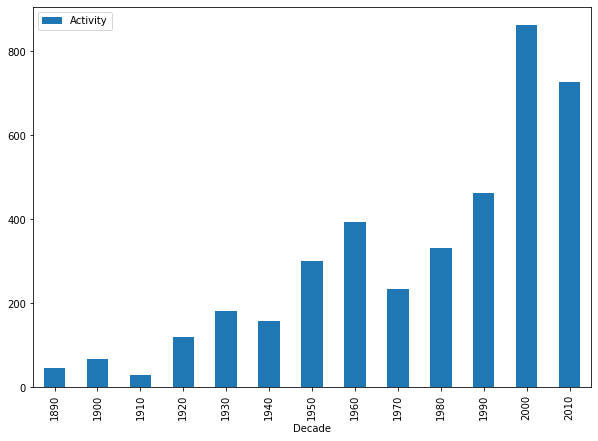

In [70]:

%matplotlib inline
shark_final.groupby("Decade").agg({"Activity":"count"}).plot.bar(figsize=(10,7))


<center><h4><font color='green'>Hypothesis confirmed</font></h4></center>

-------------------

<center>The year in which there have been more shark attacks is <b>in this decade</b>.</center>

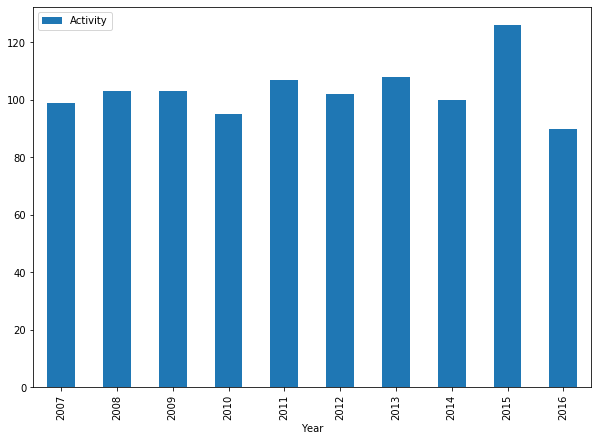

In [71]:

%matplotlib inline
shark_final.groupby("Year").agg({"Activity":"count"}).nlargest(10, "Activity").sort_values("Year").plot.bar(figsize=(10,7))




<center><h4><font color='green'>Hypothesis confirmed</font></h4></center>

------------------

-------------------------------------------

<center><h3>Hypothesis 2:</h3></center>

<center>The main activity in which, <b>men</b> have more accidents is related to <b>surfing</b>.</center> 
    
<center>The main activity in which, <b>women</b> have more accidents is related to <b>swimming</b>.</center> 

In [72]:
shark_final_gender_activity = shark_final

shark_final_gender_activity["Is male"]= np.where(shark_final.Gender=="M",True,False)

shark_final_gender_activity["Is female"]= np.where(shark_final.Gender=="F",True,False)


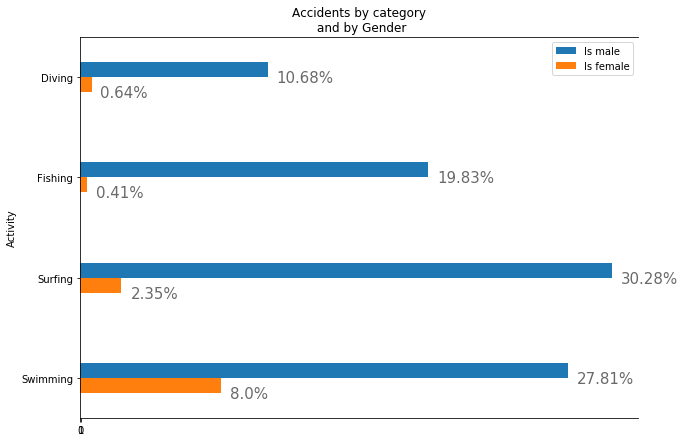

In [73]:
%matplotlib inline
ax_shark = shark_final_gender_activity.groupby("Activity").agg({"Is male":"sum","Is female":"sum"}).plot(kind="barh",width=0.3,figsize=(10,7))


ax_shark.set_title("Accidents by category\n and by Gender")
ax_shark.set_xticks([0,1])

totals = []
for i in ax_shark.patches:
    totals.append(i.get_width())
total = sum(totals)

for i in ax_shark.patches:
    ax_shark.text(i.get_width()+20, i.get_y()+.20, \
            str(round((i.get_width()/total)*100, 2))+'%', fontsize=15,
color='dimgrey')

ax_shark.spines["right"].set_visible(False)
    
ax_shark.invert_yaxis()



<center><h4><font color='green'>Hypothesis confirmed</font></h4></center>

----------------------------------

<i>Wow! Nice precision!

And we have done some shiny charts that confirms all of our hypothesys! 👍🐍